In [390]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import keras
import keras.applications
import keras.preprocessing.image
from keras.layers import *
from keras.regularizers import *
from keras.optimizers import *
from keras.models import *
import tensorflow as tf
import collections
import PIL

import scipy
import sklearn
import sklearn.metrics
from sklearn.pipeline import Pipeline

import math

import sys
import logging 
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
logging.getLogger("py.warnings").setLevel(logging.ERROR)

%matplotlib inline

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [391]:
import general
from general.plotting import gridplot
general.dl.make_keras_picklable()

In [392]:
import simpsons

In [393]:
tf.__version__, keras.__version__, np.__version__

('1.0.0', '1.2.1', '1.12.1')

In [394]:
from tensorflow.python.client import device_lib
local_device_protos = device_lib.list_local_devices()
[x.name for x in local_device_protos]

['/cpu:0']

# Some configs

In [395]:
config = dict(
    training_img_shape=(202,360),     # 1/4 of HD image
    test_img_shape=(202,360),         # ...
)

# Load datasets

In [403]:
import gzip
import pickle

with gzip.GzipFile("../../datalab-data/simpsons/dataset.pickle.zip", "r") as f:
    data = pickle.load(f)

In [404]:
print("train images by char: ", data.train.y.sum(axis=0))
print("train_dev images by char: ", data.train_dev.y.sum(axis=0))
print("dev  images by char: ", data.dev.y.sum(axis=0))
print("test images by char: ", data.test.y.sum(axis=0))
data.show()

train images by char:  [ 91.  79.  64.  37.]
train_dev images by char:  [ 30.  26.  22.  12.]
dev  images by char:  [  74.  101.   66.   65.]
test images by char:  [  73.  102.   64.   64.]
train
  - X: (474, 200, 200, 3)
  - y: (474, 4)
train_dev
  - X: (158, 200, 200, 3)
  - y: (158, 4)
dev
  - X: (351, 202, 360, 3)
  - y: (351, 4)
test
  - X: (351, 202, 360, 3)
  - y: (351, 4)


# Augmenting training set

In [405]:
%store -r background_images
if 'background_images' not in vars(): 
    frame_generator = simpsons.preprocessing.SimpsonsFrameGenerator(
        background_videoclips_path="data/preprocessing/training/backgrounds",
        background_required_num=100, 
        background_output_shape=config['training_img_shape'],
    )
    background_images = frame_generator.background_images
    %store background_images    
    
    import pickle
    import gzip
    import time

    with gzip.GzipFile("data/background_images.pickle.zip", 'wb') as f:
        pickle.dump(background_images, f)

# Build network

In [53]:
def create_simple_model(num_filters, opt='adam', dropout=0.5):
    model = Sequential()
    model.add(ZeroPadding2D((2,2), input_shape=(None,None,3)))
    model.add(Convolution2D(32,5,5, activation='relu'))
    model.add(MaxPooling2D((2,2)))
    
    model.add(ZeroPadding2D((2,2)))
    model.add(Convolution2D(64,5,5, activation='relu'))
    model.add(MaxPooling2D((2,2)))
    
    model.add(ZeroPadding2D((2,2)))
    model.add(Convolution2D(64,5,5, activation='relu'))
    model.add(MaxPooling2D((2,2)))
    
    model.add(ZeroPadding2D((2,2)))
    model.add(Convolution2D(num_filters, 1,1, activation='relu'))
    model.add(Dropout(dropout, name='dropout'))
    model.add(GlobalMaxPooling2D(name='detectors'))

    model.add(Dense(5, name='output', activation='sigmoid'))
    model.compile(optimizer=opt, loss='mse', metrics=['mae'])
    return model
    
    
def create_model(opt='adam', fc_detectors=[], train_all=False, batchnorm=True, dropout=0.5, base_output_layer='block5_pool', num_detectors=16, num_outputs=4):
    if type(base_output_layer) is int:
        base_output_layer = "block{}_pool".format(base_output_layer)

    unknown_img_size_inp = Input(shape=(None,None,3), name='input')
    vgg = keras.applications.vgg16.VGG16(include_top=False)
    base_model = Model(input=vgg.input, output=vgg.get_layer(base_output_layer).output)
    
    base_model_output = x = base_model(unknown_img_size_inp)
    
    if batchnorm:
        x = BatchNormalization(name='bn')(x)
    x = Dropout(dropout, name="dropout")(x)

    for ind, fc_det in enumerate(fc_detectors):
        x = Convolution2D(fc_det, 1, 1, name="fc_detector_{}".format(ind))(x)
    
    x = Convolution2D(num_detectors,1,1, name='detectors_spatial')(x)
    x = GlobalMaxPooling2D(name='detectors')(x)
    
    x = Dense(num_outputs, name='output', activation='sigmoid')(x)
       
    model = Model(input=unknown_img_size_inp, output=x) 
    
    # Compile model    
    if not train_all:
        for l in base_model.layers:
            l.trainable = False
    
    model.compile(optimizer=opt, loss='mse', metrics=['mae', 'accuracy'])
    return model


# Train

Trying to train for a single character only (bart), single model:

In [54]:
# choose characters
chars_chooser = simpsons.preprocessing.CharactersChooser([0,1,2,3])  # bart,homer,lisa,marge
train_X, train_y         = chars_chooser.transform(data.train.X, data.train.y)
train_dev_X, train_dev_y = chars_chooser.transform(data.train_dev.X, data.train_dev.y)
dev_X, dev_y             = chars_chooser.transform(data.dev.X, data.dev.y)


# Create ConstantCVSplitter
all_train_x, all_train_y, cv_splitter = general.utils.ConstantCVSplitter(
    train_X, train_y, train_dev_X, train_dev_y
).split()

# Custom Simpsons scorer
simpsons_scorer = simpsons.scoring.SimpsonsDevsetScorer(dev_X, dev_y)

# Preprocess pipeline
simpsons_preprocess = Pipeline([
        ('vgg_preprocessor', simpsons.preprocessing.VGGPreprocessing()),
    ])

# simpsons frame generator
frame_generator = simpsons.preprocessing.SimpsonsFrameGenerator(
    preprocess_pipeline=simpsons_preprocess,
    background_images=background_images, 
    background_videoclips_path="data/preprocessing/training/backgrounds",
    background_required_num=100, 
    background_output_shape=config['training_img_shape'],
)


In [193]:
# Run model only and visualize learning curve (loss/epoch)
build_params = [
    {
        'num_outputs': [4], 
        'num_detectors': [128],
        'fc_detectors': [[64]],
    }
]
generator_params = [
    {
        'batch_size': [32],
        'output_shape': [ config['training_img_shape'] ],
        'max_num_characters': [4],
        'train_shape_range': [[0.8,1.0]],        
    }
]

gch = general.dl.DLGridSearch(create_model, build_params=build_params,
                generator_fn=frame_generator.generate, generator_params=generator_params)

gch.fit(data.train.X[:10,:100,:100], data.train.y[:10], train_dev_X[:10,:100,:100], train_dev_y[:10], nb_epoch=5)

INFO:general.dl.dl_grid_search:got 1 generator params options and 1 build params options. overall - 1 options to try
INFO:general.dl.dl_grid_search:fitting model (1/1) with params: {'output_shape': (202, 360), 'fc_detectors': [64], 'train_shape_range': [0.8, 1.0], 'num_outputs': 4, 'max_num_characters': 4, 'num_detectors': 128, 'batch_size': 32}
Epoch 1/5
158s - loss: 0.6318 - mean_absolute_error: 0.7017 - acc: 0.0312 - val_loss: 0.3518 - val_mean_absolute_error: 0.5599 - val_acc: 0.1000
Epoch 2/5
120s - loss: 0.4318 - mean_absolute_error: 0.5054 - acc: 0.1875 - val_loss: 0.3223 - val_mean_absolute_error: 0.5326 - val_acc: 0.1000
Epoch 3/5
101s - loss: 0.3928 - mean_absolute_error: 0.4795 - acc: 0.1562 - val_loss: 0.2935 - val_mean_absolute_error: 0.5033 - val_acc: 0.1000
Epoch 4/5
91s - loss: 0.3383 - mean_absolute_error: 0.4153 - acc: 0.1875 - val_loss: 0.2669 - val_mean_absolute_error: 0.4753 - val_acc: 0.1000
Epoch 5/5
102s - loss: 0.3437 - mean_absolute_error: 0.4292 - acc: 0.1250

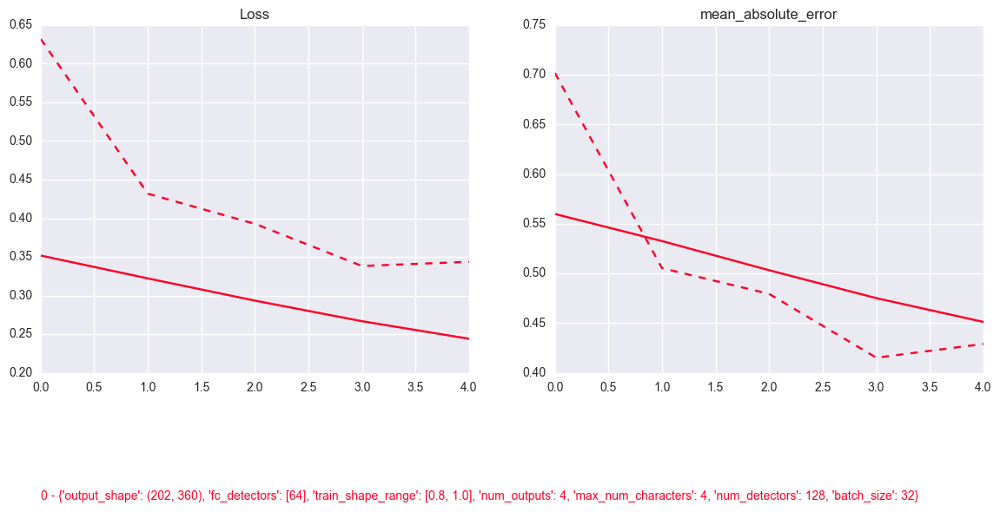

In [194]:
general.plotting.KerasHistoryPlotter().plot(gch.results)

In [261]:
%autoreload
import imp
imp.reload(simpsons.scoring)
simpsons.scoring.SimpsonsReporter(
        train_dev_X[0:40], train_dev_y[0:40], data.dev.X[0:40], data.dev.y[0:40], 
        dev_preprocess=simpsons_preprocess, generator_fn=frame_generator.generate,
        train_dev_num_images=20
).report(gch.results)

In [260]:
sorted([0.5,0.6,0.2,0.9])

[0.2, 0.5, 0.6, 0.9]

In [26]:
simpsons.scoring.SimpsonsReporter(
        train_dev_X, train_dev_y, dev_X, dev_y, 
        dev_preprocess=simpsons_preprocess, generator_fn=frame_generator.generate,
        train_dev_num_images=500
).report(gch.results)

In [243]:
preds = model.predict(data.dev.X[:10])

In [244]:
data.dev.y[:10]

array([[ 1.,  1.,  0.,  0.],
       [ 0.,  0.,  1.,  0.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.],
       [ 0.,  1.,  0.,  0.],
       [ 0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.]])

In [247]:
dev_y, dev_pred = data.dev.y[:10], preds

In [249]:
max_accs = [
            sorted([ (t, (dev_y[:,char_ind] == (dev_pred[:,char_ind] > t).astype(int)).mean()) for t in np.linspace(0.,1.,21) ], key=lambda x:x[1])[-1][0]
            for char_ind in range(dev_y.shape[1])
        ]
",".join("{:.2f}".format(x) for x in max_accs)

'0.75,0.35,0.90,1.00'

# Show some tagged frames

In [ ]:
dev_sample = data.dev.X[np.random.choice(range(data.dev.X.shape[0]), 20, replace=False)]
model_id = 0
model = gch.results[model_id].history.model
print("params - ", gch.results[model_id].params)

preds = model.predict(simpsons_preprocess.transform(dev_sample))
gridplot(dev_sample, titles=[ ",".join("{:.2f}".format(s) for s in scores) for scores in preds ], num_cols=4)

In [28]:
gch.results[model_id].history.model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input (InputLayer)               (None, None, None, 3) 0                                            
____________________________________________________________________________________________________
model_17 (Model)                 (None, None, None, 51 14714688    input[0][0]                      
____________________________________________________________________________________________________
bn (BatchNormalization)          (None, None, None, 51 2048        model_17[1][0]                   
____________________________________________________________________________________________________
dropout (Dropout)                (None, None, None, 51 0           bn[0][0]                         
___________________________________________________________________________________________

# Show some generated training images

In [ ]:
%autoreload 
import imp
imp.reload(simpsons.preprocessing)
from general.plotting import gridplot

# Preprocess pipeline
simpsons_preprocess = Pipeline([
        ('vgg_preprocessor', simpsons.preprocessing.VGGPreprocessing()),
        ('vgg_preprocessor_bw', simpsons.preprocessing.VGGPreprocessing(backwards=True)),
        #('blur', simpsons.preprocessing.BlurTransformer(3.0))
    ])


frame_generator = simpsons.preprocessing.SimpsonsFrameGenerator(
    background_images=background_images, preprocess_pipeline=simpsons_preprocess)

g = frame_generator.generate(data.train.X, data.train.y, max_num_characters=3, batch_size=32,
                             output_shape=config['training_img_shape'], train_shape_range=[0.5,1.0])

gen_imgs, gen_labels = next(g)
gridplot(gen_imgs, titles=gen_labels, num_cols=3)

In [175]:
%autoreload
simpsons.scoring.final_report(data.dev.y[:50], preds_acc)

Char #0 - bart
ACCURACY - 0.940
[[39  0]
 [ 3  8]]
             precision    recall  f1-score   support

        0.0       0.93      1.00      0.96        39
        1.0       1.00      0.73      0.84        11

avg / total       0.94      0.94      0.94        50




Char #1 - homer
ACCURACY - 0.840
[[35  2]
 [ 6  7]]
             precision    recall  f1-score   support

        0.0       0.85      0.95      0.90        37
        1.0       0.78      0.54      0.64        13

avg / total       0.83      0.84      0.83        50




Char #2 - lisa
ACCURACY - 0.900
[[41  0]
 [ 5  4]]
             precision    recall  f1-score   support

        0.0       0.89      1.00      0.94        41
        1.0       1.00      0.44      0.62         9

avg / total       0.91      0.90      0.88        50




Char #3 - marge
ACCURACY - 0.960
[[42  0]
 [ 2  6]]
             precision    recall  f1-score   support

        0.0       0.95      1.00      0.98        42
        1.0       1.00      0.75 

In [ ]:
# Run pipeline
params = [
    {
        'num_outputs': [4],
        'output_shape': [ (200,200) ],
        'train_shape_range': [[0.25, 0.8], [1.0,1.0]] 
    }
]

model = general.wrappers.KerasClassifier(
    build_fn=create_model, generator_fn=frame_generator.generate,
    nb_epoch=250,
)

gcv = sklearn.model_selection.GridSearchCV(model, params, cv=cv_splitter, scoring=simpsons_scorer)
gcv.fit(all_train_x, all_train_y)

In [ ]:
pd.DataFrame(gcv.cv_results_)

20 0 (202, 360)
36 0 (202, 360)
20 0 (202, 360)
18 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
16 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
35 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
15 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
45 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
23 0 (202, 360)
0 0 (202, 360)
33 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
7 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
28 0 (202, 360)
26 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
12 0 (202, 360)
0 0 (202, 360)
42 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
0 0 (202, 360)
22 0 (202, 360)
8 0 (202, 360)
0 0 (202, 360)


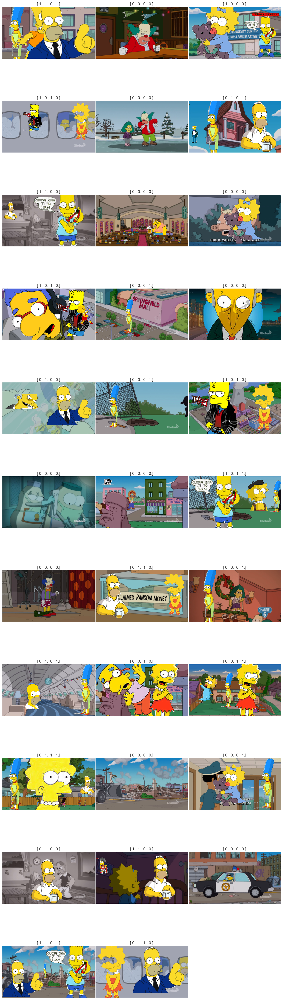

In [426]:
%autoreload 
from general.plotting import gridplot
frame_generator = simpsons.preprocessing.SimpsonsFrameGenerator(
    background_images=background_images)

g = frame_generator.generate(data.train.X, data.train.y, max_num_characters=3, batch_size=32,
                             output_shape=config['training_img_shape'], train_shape_range=[0.3,1.5])
gen_imgs, gen_labels = next(g)
gridplot(gen_imgs, titles=gen_labels, num_cols=3)

In [409]:
bart_train = data.train.X[np.where(data.train.y[:,0]==1)]
homer_train = data.train.X[np.where(data.train.y[:,1]==1)]
lisa_train = data.train.X[np.where(data.train.y[:,2]==1)]
marge_train = data.train.X[np.where(data.train.y[:,3]==1)]

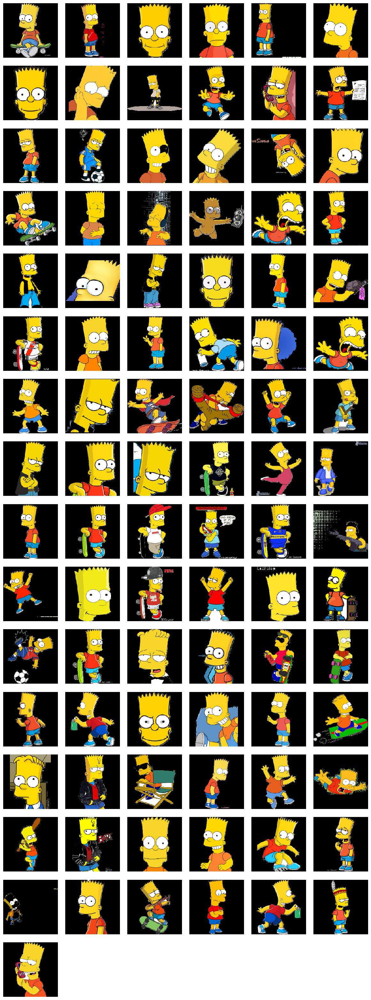

In [410]:
gridplot(bart_train)

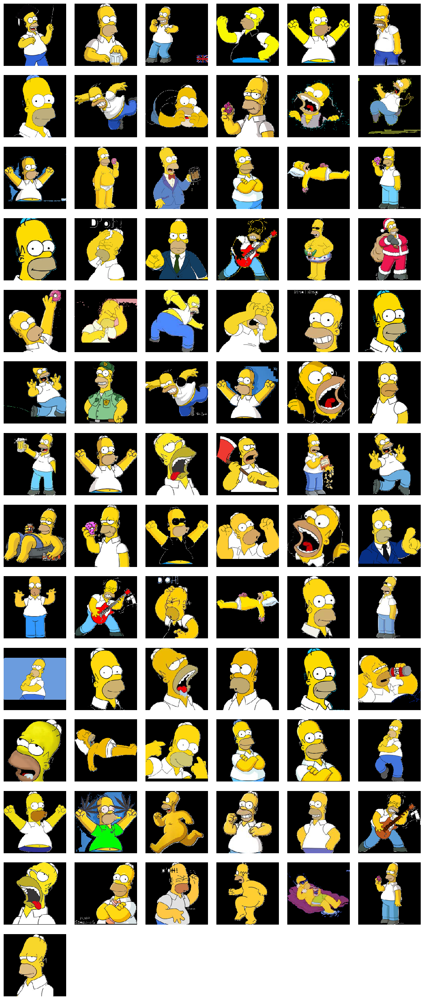

In [411]:
gridplot(homer_train)

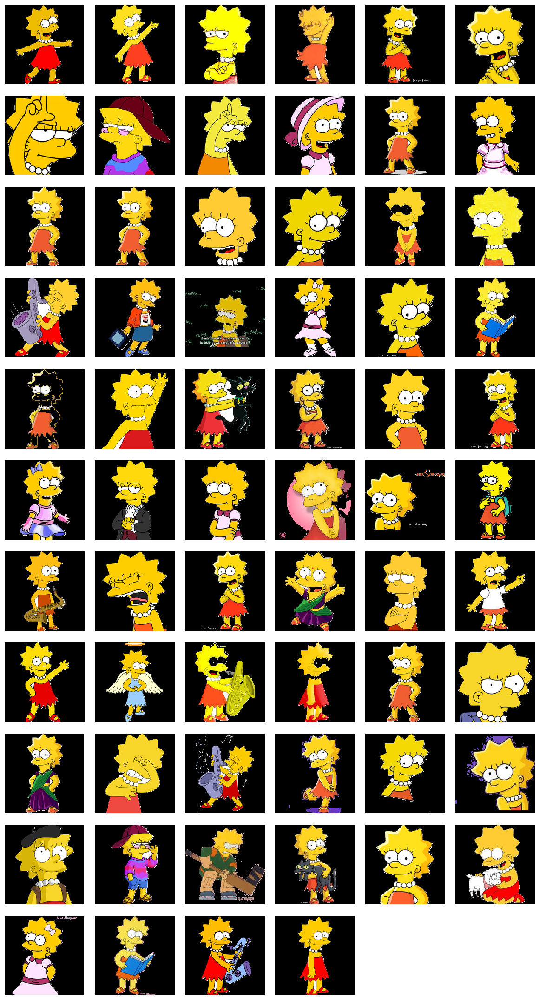

In [412]:
gridplot(lisa_train)

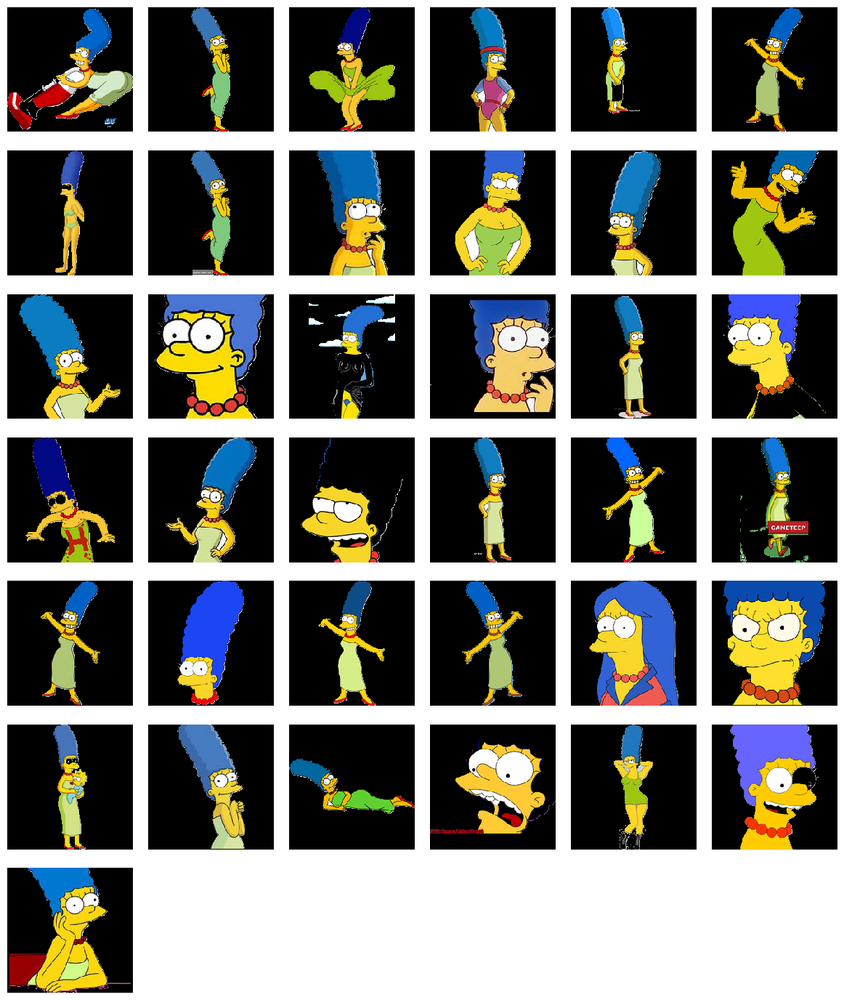

In [413]:
gridplot(marge_train)

In [4]:
import simpsons

In [5]:
model = simpsons.model.SimpsonsModel(model, [0.5,0.5,0.5,0.5])

In [6]:
video_filename = "data/preprocessing/test/full-episodes/The.Simpsons.S27E18.HDTV.x264-KILLERS[eztv].mkv"
frames = model.analyze_video(video_filename, extractor_params=dict(frames_per_second=2))

In [7]:
idxs = range(1010,1015)
preds = model.predict(frames[idxs])

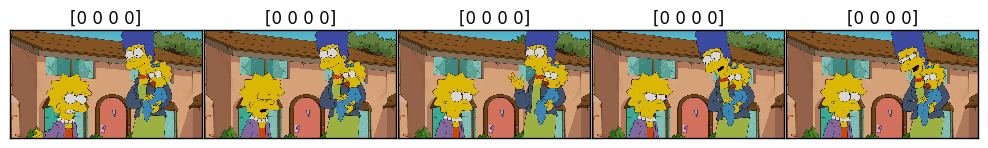

In [9]:
from general.plotting import gridplot
gridplot(frames[idxs], titles=preds.astype(int))

In [90]:
frames.shape

(2555, 404, 720, 3)

In [12]:
preds2 = model2.predict(frames[idxs])

In [13]:
preds

array([[False, False, False, False],
       [False, False, False, False],
       [False, False, False, False],
       [False, False, False, False],
       [False, False, False, False]], dtype=bool)

In [14]:
preds2

array([[False, False, False, False],
       [False, False, False, False],
       [False, False, False, False],
       [False, False, False, False],
       [False, False, False, False]], dtype=bool)